<a href="https://colab.research.google.com/github/numarkevich/hse-homeworks/blob/master/Cats%26Dogs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
print('Found GPU at: {}'.format(device_name))

Found GPU at: 


In [0]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
from keras.models import Sequential
from keras.layers import Convolution2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from keras.layers import Dense

Using TensorFlow backend.


In [0]:
# Создаем CNN
classifier = Sequential()

# Свертка (Convolution)
classifier.add(Convolution2D(32, (3, 3), strides=(1, 1), input_shape = (128, 128, 3), activation = 'relu'))

# Объединение (Pooling)
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Второй сверточный слой
classifier.add(Convolution2D(32, (3, 3), activation = 'relu'))
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Уплощение (Flattening)
classifier.add(Flatten())

# Полносвязянный слой (Full connection)
classifier.add(Dense(units = 128, activation = 'relu'))
classifier.add(Dense(units = 1, activation = 'sigmoid'))

# Компиляция CNN
classifier.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

Instructions for updating:
Colocations handled automatically by placer.


In [0]:
from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 45,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

training_set = train_datagen.flow_from_directory('/content/gdrive/My Drive/Colab Notebooks/Cats&Dogs/training_set',
                                                 target_size = (128, 128),
                                                 batch_size = 40,
                                                 class_mode = 'binary')

test_set = test_datagen.flow_from_directory('/content/gdrive/My Drive/Colab Notebooks/Cats&Dogs/test_set',
                                            target_size = (128, 128),
                                            batch_size = 40,
                                            class_mode = 'binary')

Found 9676 images belonging to 2 classes.
Found 5482 images belonging to 2 classes.


In [0]:
classifier.fit_generator(training_set,
                         steps_per_epoch = 200,
                         epochs = 25,
                         validation_data = test_set,
                         validation_steps = 50)

Instructions for updating:
Use tf.cast instead.
Epoch 1/25
200/200 [==============================] - 3148s 16s/step - loss: 0.0035 - acc: 0.9966 - val_loss: 7.4850 - val_acc: 0.5305
Epoch 2/25
200/200 [==============================] - 1097s 5s/step - loss: 1.1921e-07 - acc: 1.0000 - val_loss: 7.8835 - val_acc: 0.5055
Epoch 3/25
200/200 [==============================] - 575s 3s/step - loss: 1.1922e-07 - acc: 1.0000 - val_loss: 7.5730 - val_acc: 0.5250
Epoch 4/25
200/200 [==============================] - 281s 1s/step - loss: 1.1921e-07 - acc: 1.0000 - val_loss: 7.8277 - val_acc: 0.5090
Epoch 5/25
200/200 [==============================] - 279s 1s/step - loss: 1.1921e-07 - acc: 1.0000 - val_loss: 7.5089 - val_acc: 0.5290
Epoch 6/25
200/200 [==============================] - 278s 1s/step - loss: 1.1921e-07 - acc: 1.0000 - val_loss: 7.6624 - val_acc: 0.5194
Epoch 7/25
200/200 [==============================] - 279s 1s/step - loss: 1.1921e-07 - acc: 1.0000 - val_loss: 7.3973 - val_acc: 0

In [0]:
import numpy as np
from keras.preprocessing import image
test_image = image.load_img('/content/gdrive/My Drive/Colab Notebooks/Cats&Dogs/single_prediction/IMG_9486.jpg', target_size = (128, 128))
test_image = image.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis = 0)
result = classifier.predict(test_image)
training_set.class_indices
if result[0][0] == 1:
    prediction = 'dog'
else:
    prediction = 'cat'

In [0]:
def dogorcat(result):
  if result[0][0] == 1:
        return 'dog'
  else:
        return 'cat'

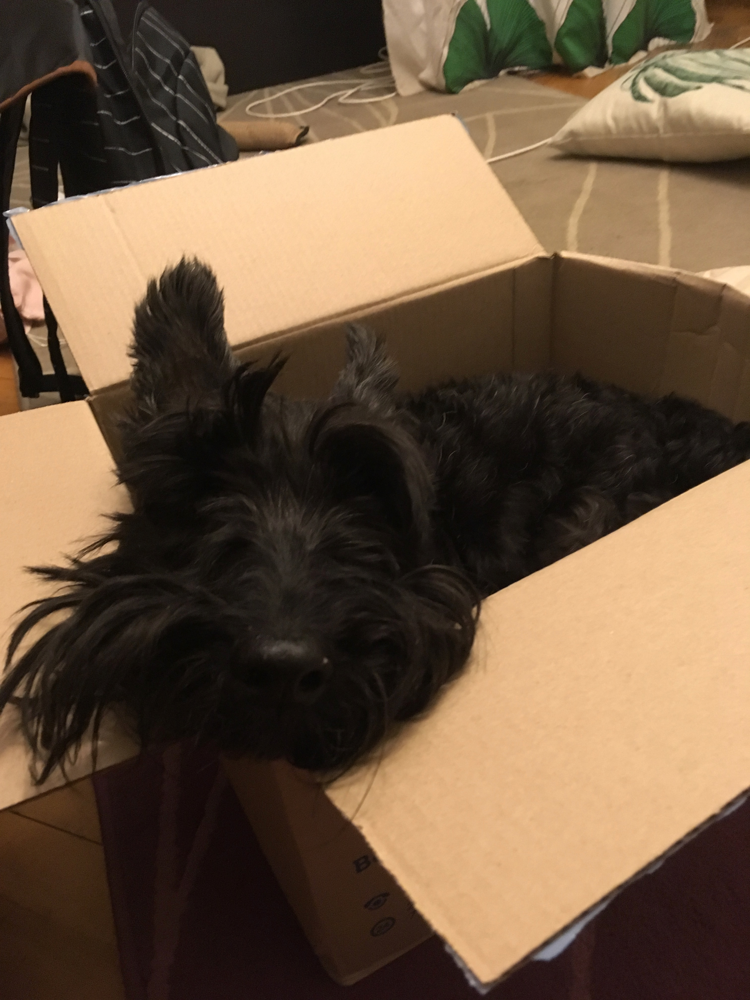

dog


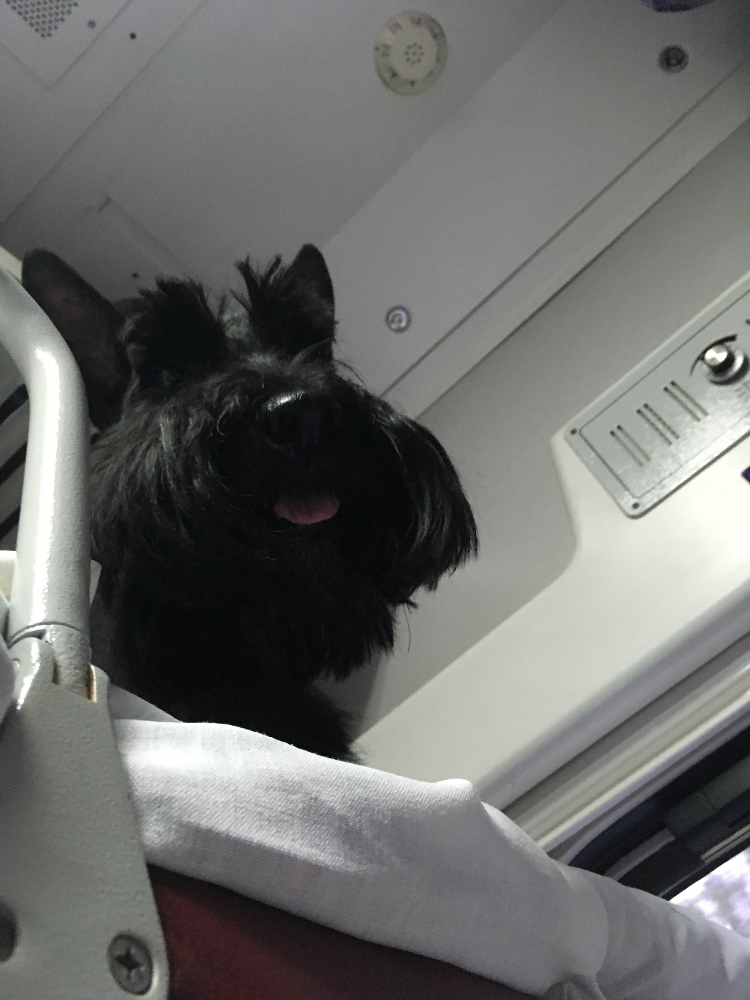

dog


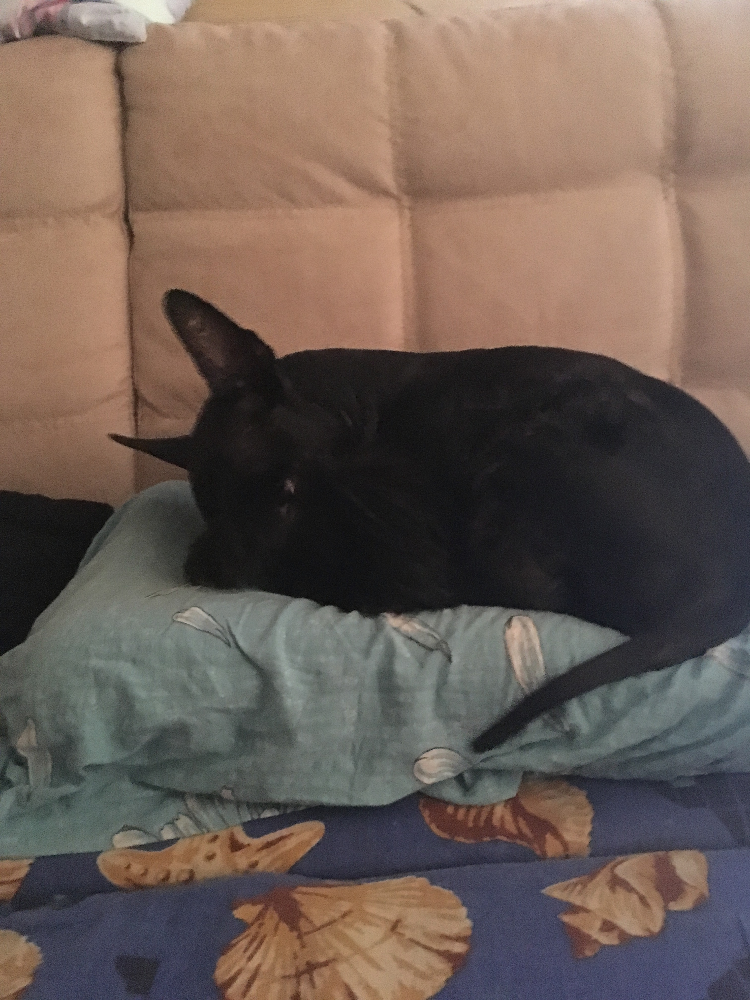

dog


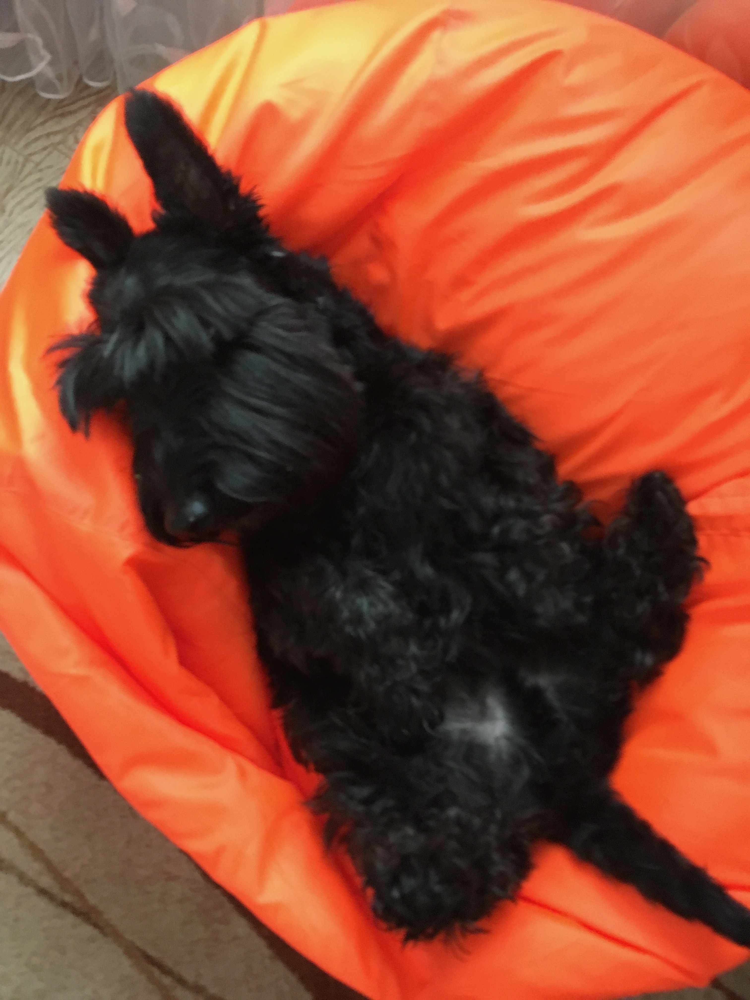

dog


In [0]:
import glob
from IPython.display import Image, display
for imageName in glob.glob('/content/gdrive/My Drive/Colab Notebooks/Cats&Dogs/single_prediction/*'):
    display(Image(filename=imageName, width=350, ))
    test_image = image.load_img(imageName, target_size = (128, 128))
    test_image = image.img_to_array(test_image)
    test_image = np.expand_dims(test_image, axis = 0)
    result = classifier.predict(test_image)    
    print(dogorcat(result))